# Grouping of Stock by Volatility

Try clustering methods to group stocks into classes.


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.cluster.hierarchy import dendrogram
%matplotlib inline


from sklearn.cluster import AgglomerativeClustering

In [2]:
df = pd.read_csv('volatility2019.csv')[['ticker','industry','sector','mean_price','volatility_5d']]
df

,ticker,industry,sector,mean_price,volatility_5d
0,7UP,Resources,Energy & Utilities,0.037311,0.000818
1,A,Property & Construction,Property Development,0.749460,0.011173
2,AAV,Services,Transportation & Logistics,0.263574,0.004558
3,ABPIF,Resources,Energy & Utilities,0.144353,0.011268
4,ACC,Consumer Products,Home & Office Products,0.257742,0.005764
...,...,...,...,...,...
464,WHA,Property & Construction,Property Development,0.826224,0.034043
465,WIIK,Property & Construction,Construction Materials,0.136011,0.001798
466,WIN,Property & Construction,Property Development,0.117041,0.010141
467,WORK,Services,Media & Publishing,0.096761,0.001617


Text(0.5, 1.0, 'Volatility by Sector (2019)')

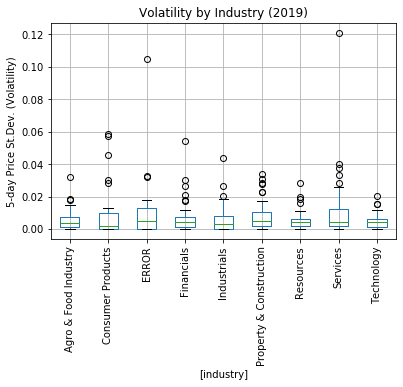

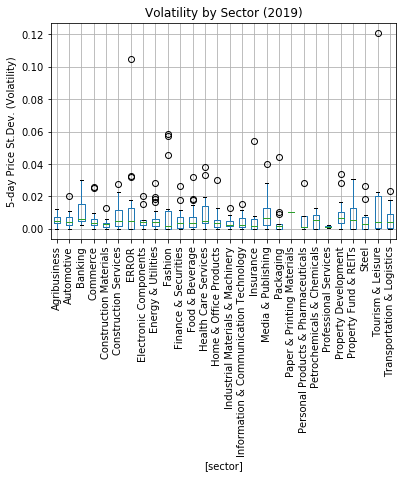

In [41]:
ax = df[['industry', 'volatility_5d']].boxplot(by=['industry'], rot=90)
plt.ylabel('5-day Price St.Dev. (Volatility)')
plt.suptitle('')
plt.title("Volatility by Industry (2019)")

ax = df[['sector', 'volatility_5d']].boxplot(by=['sector'], rot=90)
plt.ylabel('5-day Price St.Dev. (Volatility)')
plt.suptitle('')
plt.title("Volatility by Sector (2019)")

In [3]:
# Parameter distance_threshold and n_clusters are either or. Set only one and leave another as None.

model = AgglomerativeClustering(distance_threshold=None, n_clusters=2)
clustering_class = model.fit_predict(df[['volatility_5d']])

In [4]:
clustering_class

array([1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,
       0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0,

In [5]:
len(clustering_class)

469

In [6]:
df['cluster_class'] = clustering_class

def get_label(ticker):
    r = df.loc[df['ticker']==ticker]
    label = """cls=%s %.4f %s %s / %s""" % (r['cluster_class'].values[0], r['volatility_5d'].values[0], r['ticker'].values[0], r['industry'].values[0], r['sector'].values[0])
    # print(label)
    return label


# df['label'] = """%s cls=%s %s""" % (df['volatility_5d'], df['cluster_class'], df['ticker'])

df['label'] = df['ticker'].map(get_label)

# df.loc[df['cluster_class']==0]
# df.loc[df['cluster_class']==1]

df

,ticker,industry,sector,mean_price,volatility_5d,cluster_class,label
0,7UP,Resources,Energy & Utilities,0.037311,0.000818,1,cls=1 0.0008 7UP Resources / Energy & Utilities
1,A,Property & Construction,Property Development,0.749460,0.011173,0,cls=0 0.0112 A Property & Construction / Prope...
2,AAV,Services,Transportation & Logistics,0.263574,0.004558,1,cls=1 0.0046 AAV Services / Transportation & L...
3,ABPIF,Resources,Energy & Utilities,0.144353,0.011268,0,cls=0 0.0113 ABPIF Resources / Energy & Utilities
4,ACC,Consumer Products,Home & Office Products,0.257742,0.005764,1,cls=1 0.0058 ACC Consumer Products / Home & Of...
...,...,...,...,...,...,...,...
464,WHA,Property & Construction,Property Development,0.826224,0.034043,0,cls=0 0.0340 WHA Property & Construction / Pro...
465,WIIK,Property & Construction,Construction Materials,0.136011,0.001798,1,cls=1 0.0018 WIIK Property & Construction / Co...
466,WIN,Property & Construction,Property Development,0.117041,0.010141,1,cls=1 0.0101 WIN Property & Construction / Pro...
467,WORK,Services,Media & Publishing,0.096761,0.001617,1,cls=1 0.0016 WORK Services / Media & Publishing


<Figure size 1600x480 with 0 Axes>

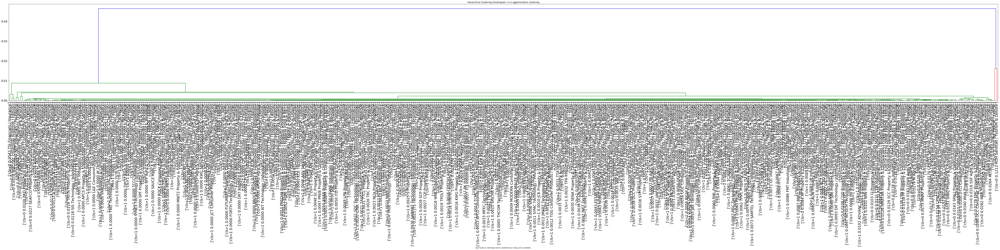

In [7]:
# Visualize with dendogram
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html



from matplotlib.pyplot import figure
figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')

from scipy.cluster.hierarchy import dendrogram, linkage

links = linkage(df[['volatility_5d']].values, 'single')
# dendrogram(links, orientation='top', labels=groups.labels_, distance_sort='descending', show_leaf_counts=True)

#    linkage_matrix = np.column_stack([model.children_, model.n_leaves_,
#                                      counts]).astype(float)


plt.figure(figsize=(100, 10), dpi=80, facecolor='w', edgecolor='k')
plt.title('Hierarchical Clustering Dendrogram: n=2 agglomerative clustering')
# plot the top three levels of the dendrogram
dendrogram(links, orientation='top', labels=df[['label']].values, distance_sort='descending', show_leaf_counts=True)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20)
ax.tick_params(axis='y', which='major', labelsize=16)
plt.xlabel("Leaf node is individual stock clustered by 5-day price volatility.")
plt.show()

# n=4 agglomerative clustering

In [8]:
model = AgglomerativeClustering(distance_threshold=None, n_clusters=4)
clustering_class = model.fit_predict(df[['volatility_5d']])


clustering_class


array([0, 3, 0, 3, 0, 0, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3,
       1, 0, 0, 1, 0, 0, 0, 3, 0, 0, 0, 3, 0, 3, 0, 3, 0, 0, 0, 0, 3, 0,
       0, 0, 0, 0, 3, 0, 3, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3,
       0, 0, 3, 3, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 3, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 3,
       0, 0, 0, 3, 0, 0, 0, 2, 3, 3, 0, 0, 0, 0, 0, 0, 3, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 0, 0, 0, 0, 3, 0, 0, 3, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 3, 0, 0, 0,
       0, 0, 0, 0, 3, 3, 0, 0, 0, 3, 0, 3, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0,
       3, 3, 0, 0, 0, 0, 0, 0, 3, 0, 3, 3, 0, 3, 1,

In [9]:
df['cluster_class'] = clustering_class
df['label'] = df['ticker'].map(get_label)

df

,ticker,industry,sector,mean_price,volatility_5d,cluster_class,label
0,7UP,Resources,Energy & Utilities,0.037311,0.000818,0,cls=0 0.0008 7UP Resources / Energy & Utilities
1,A,Property & Construction,Property Development,0.749460,0.011173,3,cls=3 0.0112 A Property & Construction / Prope...
2,AAV,Services,Transportation & Logistics,0.263574,0.004558,0,cls=0 0.0046 AAV Services / Transportation & L...
3,ABPIF,Resources,Energy & Utilities,0.144353,0.011268,3,cls=3 0.0113 ABPIF Resources / Energy & Utilities
4,ACC,Consumer Products,Home & Office Products,0.257742,0.005764,0,cls=0 0.0058 ACC Consumer Products / Home & Of...
...,...,...,...,...,...,...,...
464,WHA,Property & Construction,Property Development,0.826224,0.034043,1,cls=1 0.0340 WHA Property & Construction / Pro...
465,WIIK,Property & Construction,Construction Materials,0.136011,0.001798,0,cls=0 0.0018 WIIK Property & Construction / Co...
466,WIN,Property & Construction,Property Development,0.117041,0.010141,0,cls=0 0.0101 WIN Property & Construction / Pro...
467,WORK,Services,Media & Publishing,0.096761,0.001617,0,cls=0 0.0016 WORK Services / Media & Publishing


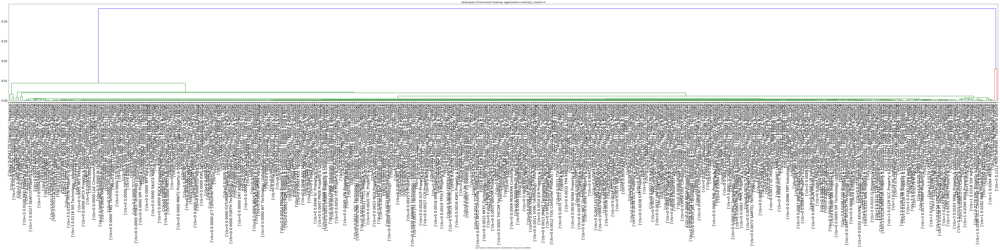

In [10]:
links = linkage(df[['volatility_5d']].values, 'single')
plt.figure(figsize=(100, 10), dpi=80, facecolor='w', edgecolor='k')
plt.title('Dendrogram of Hierarchical Clustering: agglomerative clustering n_clusters=4')
# plot the top three levels of the dendrogram
dendrogram(links, orientation='top', labels=df[['label']].values, distance_sort='descending', show_leaf_counts=True)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20)
ax.tick_params(axis='y', which='major', labelsize=16)
plt.xlabel("Leaf node is individual stock clustered by 5-day price volatility.")
plt.show()

Text(0.5, 1.0, 'Distribution of classes found by hirerchical clustering: n_clusters=4')

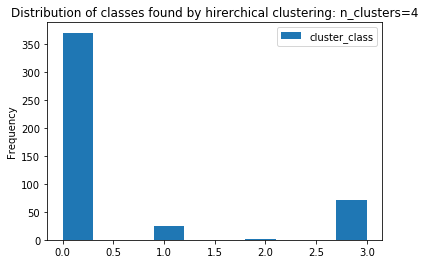

In [11]:
df[['cluster_class']].plot.hist()
plt.title("Distribution of classes found by hirerchical clustering: n_clusters=4")

# n=10 agglomerative clustering

In [12]:
model = AgglomerativeClustering(distance_threshold=None, n_clusters=10)
clustering_class = model.fit_predict(df[['volatility_5d']])


clustering_class

array([5, 6, 7, 6, 7, 4, 6, 2, 9, 7, 7, 9, 9, 4, 5, 5, 5, 4, 6, 6, 5, 7,
       7, 4, 5, 9, 9, 9, 9, 5, 5, 1, 7, 1, 4, 5, 4, 5, 5, 5, 1, 7, 7, 1,
       2, 7, 4, 3, 5, 5, 7, 6, 5, 4, 7, 1, 4, 6, 4, 1, 9, 7, 9, 4, 1, 9,
       5, 7, 5, 5, 1, 5, 6, 9, 7, 4, 6, 5, 4, 7, 7, 7, 7, 5, 5, 5, 6, 6,
       9, 9, 6, 6, 7, 7, 6, 7, 9, 5, 7, 6, 5, 7, 5, 7, 5, 4, 9, 5, 5, 2,
       4, 9, 9, 9, 7, 4, 2, 7, 5, 7, 7, 7, 5, 4, 5, 3, 4, 5, 9, 6, 9, 9,
       9, 4, 9, 5, 5, 4, 9, 5, 4, 2, 5, 9, 9, 7, 7, 5, 7, 9, 1, 5, 4, 4,
       5, 8, 5, 5, 5, 7, 9, 9, 4, 7, 7, 7, 7, 6, 7, 5, 9, 5, 4, 5, 9, 5,
       4, 5, 9, 7, 9, 4, 5, 4, 9, 5, 1, 7, 9, 5, 6, 9, 4, 4, 4, 4, 7, 1,
       9, 5, 7, 1, 9, 9, 5, 0, 1, 1, 4, 5, 7, 5, 9, 7, 6, 9, 2, 9, 7, 5,
       5, 5, 7, 9, 9, 5, 9, 4, 5, 9, 6, 1, 7, 5, 9, 9, 1, 5, 4, 1, 4, 9,
       9, 5, 3, 5, 5, 9, 9, 4, 7, 7, 5, 5, 5, 5, 5, 2, 7, 9, 1, 5, 5, 9,
       7, 5, 4, 5, 6, 6, 5, 7, 4, 6, 7, 6, 9, 4, 6, 7, 7, 9, 9, 4, 5, 5,
       1, 6, 5, 5, 4, 5, 5, 4, 6, 7, 6, 6, 7, 6, 2,

In [13]:
df['cluster_class'] = clustering_class
df['label'] = df['ticker'].map(get_label)

df

,ticker,industry,sector,mean_price,volatility_5d,cluster_class,label
0,7UP,Resources,Energy & Utilities,0.037311,0.000818,5,cls=5 0.0008 7UP Resources / Energy & Utilities
1,A,Property & Construction,Property Development,0.749460,0.011173,6,cls=6 0.0112 A Property & Construction / Prope...
2,AAV,Services,Transportation & Logistics,0.263574,0.004558,7,cls=7 0.0046 AAV Services / Transportation & L...
3,ABPIF,Resources,Energy & Utilities,0.144353,0.011268,6,cls=6 0.0113 ABPIF Resources / Energy & Utilities
4,ACC,Consumer Products,Home & Office Products,0.257742,0.005764,7,cls=7 0.0058 ACC Consumer Products / Home & Of...
...,...,...,...,...,...,...,...
464,WHA,Property & Construction,Property Development,0.826224,0.034043,2,cls=2 0.0340 WHA Property & Construction / Pro...
465,WIIK,Property & Construction,Construction Materials,0.136011,0.001798,5,cls=5 0.0018 WIIK Property & Construction / Co...
466,WIN,Property & Construction,Property Development,0.117041,0.010141,4,cls=4 0.0101 WIN Property & Construction / Pro...
467,WORK,Services,Media & Publishing,0.096761,0.001617,5,cls=5 0.0016 WORK Services / Media & Publishing


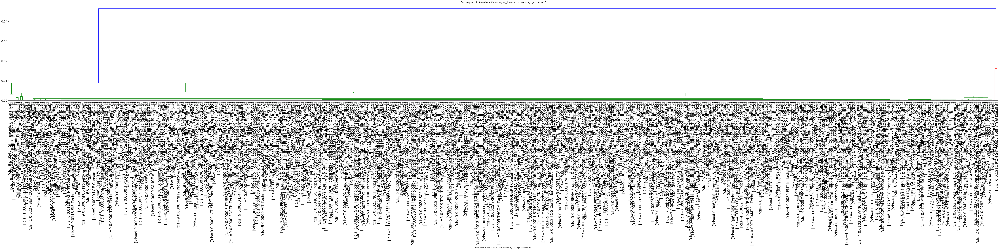

In [14]:
links = linkage(df[['volatility_5d']].values, 'single')
plt.figure(figsize=(100, 10), dpi=80, facecolor='w', edgecolor='k')
plt.title('Dendrogram of Hierarchical Clustering: agglomerative clustering n_clusters=10')
# plot the top three levels of the dendrogram
dendrogram(links, orientation='top', labels=df[['label']].values, distance_sort='descending', show_leaf_counts=True)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20)
ax.tick_params(axis='y', which='major', labelsize=16)
plt.xlabel("Leaf node is individual stock clustered by 5-day price volatility.")
plt.show()

Text(0.5, 1.0, 'Distribution of classes found by hirerchical clustering: n_clusters=10')

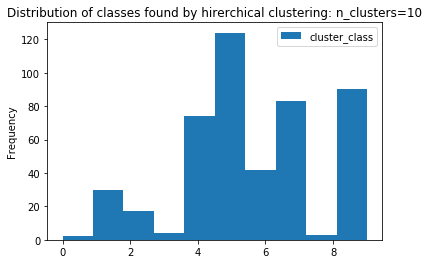

In [15]:
df[['cluster_class']].plot.hist()
plt.title("Distribution of classes found by hirerchical clustering: n_clusters=10")

Text(0.5, 1.0, 'Grouping Stock n=10 Groups By Hirerchical Clustering with Volatility')

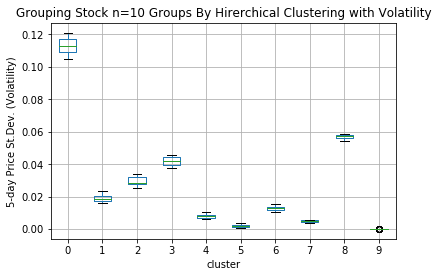

In [45]:
df[['volatility_5d','cluster_class']].boxplot(by=['cluster_class'])
plt.ylabel('5-day Price St.Dev. (Volatility)')
plt.xlabel('cluster')
plt.suptitle('')
plt.title("Grouping Stock n=10 Groups By Hirerchical Clustering with Volatility")

# DBSCAN Clustering

In [16]:
from sklearn.cluster import DBSCAN

# https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html#sklearn.cluster.DBSCAN

clustering = DBSCAN(eps=3, min_samples=2).fit(df[['volatility_5d']])

In [17]:
clustering.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [18]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4, random_state=0).fit(df[['volatility_5d']])

In [19]:
kmeans.labels_

array([0, 1, 0, 1, 0, 1, 1, 2, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1,
       2, 0, 1, 2, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 1, 0, 2, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 3, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 2,

In [20]:
df['kmeans_class'] = kmeans.labels_

df

,ticker,industry,sector,mean_price,volatility_5d,cluster_class,label,kmeans_class
0,7UP,Resources,Energy & Utilities,0.037311,0.000818,5,cls=5 0.0008 7UP Resources / Energy & Utilities,0
1,A,Property & Construction,Property Development,0.749460,0.011173,6,cls=6 0.0112 A Property & Construction / Prope...,1
2,AAV,Services,Transportation & Logistics,0.263574,0.004558,7,cls=7 0.0046 AAV Services / Transportation & L...,0
3,ABPIF,Resources,Energy & Utilities,0.144353,0.011268,6,cls=6 0.0113 ABPIF Resources / Energy & Utilities,1
4,ACC,Consumer Products,Home & Office Products,0.257742,0.005764,7,cls=7 0.0058 ACC Consumer Products / Home & Of...,0
...,...,...,...,...,...,...,...,...
464,WHA,Property & Construction,Property Development,0.826224,0.034043,2,cls=2 0.0340 WHA Property & Construction / Pro...,2
465,WIIK,Property & Construction,Construction Materials,0.136011,0.001798,5,cls=5 0.0018 WIIK Property & Construction / Co...,0
466,WIN,Property & Construction,Property Development,0.117041,0.010141,4,cls=4 0.0101 WIN Property & Construction / Pro...,1
467,WORK,Services,Media & Publishing,0.096761,0.001617,5,cls=5 0.0016 WORK Services / Media & Publishing,0


SyntaxError: unexpected EOF while parsing (<ipython-input-21-e1e73fa2a7bd>, line 2)